## Table of Content
* <b>1. Project Overview
*   1.1 Introduction
*    1.1.1 Problem Statement
*  1.2 Objectives
* <b> 2. Importing Packages
* <b> 3. Loading Data
* <b> 4. Exploratory Data Analysis (EDA)
* <b> 4.1 Summary
* <b> 4.2 Data Cleaning
* <b> 5. Regression Analysis
* <b> 6. Conclusion<b> 

# 1. Project Overview

## 1.1 Introduction

> Objective: The goal of this project is to analyze and predict CO2 emissions from the agri-food sector using data from the FAO and IPCC. By understanding the relationship between agricultural practices, climate factors, and CO2 emissions, we aim to assess the climate impact of the sector and develop sustainable strategies for policymakers and agricultural businesses.

> Importance of study: The aim of this project is to analyze and predict CO2 emissions from the agri-food sector, leveraging data from the FAO and IPCC. By understanding the complex interplay between agricultural practices, climate factors, and CO2 emissions, we seek to assess the sector's climate impact and develop sustainable strategies. This knowledge will empower policymakers and agricultural businesses to make informed decisions that mitigate climate change and ensure long-term sustainability.

> Data source: The dataset utilized was collected from diverse areas from the year of 1990 to 2020.

> Key question: Which factors have high contribution to CO2 emitted

> Methodology overview: Statistical models, such as linear regression and random forest, are used to analyze the relationship between these predictors and average temperature. Feature importance techniques help identify which variables have the most significant impact on emissions. This analysis allows for quantifying the relative contributions of each predictor, offering insights into key drivers of CO₂ emissions.

> Expected outcomes: Urban population growth contributes to higher CO₂ emissions due to increased industrialization, transportation, and energy consumption in densely populated areas. CO₂ emissions will show seasonal fluctuations, with higher emissions during periods of increased human activity, such as the dry season for savanna fires


### 1.1.1 Problem statement

## 1.2 Objectives

## 2. Importing packages

In [5]:
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt  

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
 
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

## 3. Loading data

In [6]:

dataset = pd.read_csv(r"C:\Users\bonas\Downloads\CO2_emission_agric\CO2_Emission_agric\co2_emission_agric.csv")
dataset = pd.DataFrame(dataset)
dataset

,Area,Year,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,...,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.0000,0.0,11.807483,63.1152,-2388.8030,...,319.1763,0.0,0.0,NaN,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.1600,0.0,11.712073,61.2125,-2388.8030,...,342.3079,0.0,0.0,NaN,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.0000,0.0,11.712073,53.3170,-2388.8030,...,349.1224,0.0,0.0,NaN,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.0000,0.0,11.712073,54.3617,-2388.8030,...,352.2947,0.0,0.0,NaN,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.6000,0.0,11.712073,53.9874,-2388.8030,...,367.6784,0.0,0.0,NaN,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6960,Zimbabwe,2016,1190.0089,232.5068,70.9451,7.4088,0.0,75.000000,251.1465,76500.2982,...,282.5994,0.0,0.0,417.3150,10934468.0,5215894.0,6796658.0,7656047.0,98491.026347,1.120250
6961,Zimbabwe,2017,1431.1407,131.1324,108.6262,7.9458,0.0,67.000000,255.7975,76500.2982,...,255.5900,0.0,0.0,398.1644,11201138.0,5328766.0,6940631.0,7810471.0,97159.311553,0.046500
6962,Zimbabwe,2018,1557.5830,221.6222,109.9835,8.1399,0.0,66.000000,327.0897,76500.2982,...,257.2735,0.0,0.0,465.7735,11465748.0,5447513.0,7086002.0,7966181.0,97668.308205,0.516333
6963,Zimbabwe,2019,1591.6049,171.0262,45.4574,7.8322,0.0,73.000000,290.1893,76500.2982,...,267.5224,0.0,0.0,444.2335,11725970.0,5571525.0,7231989.0,8122618.0,98988.062799,0.985667


In [7]:
# Shape of dataset
dataset.shape

(6965, 31)

The dataset consist of 31 columns, which means 30 predictors plus target variable

In [8]:
# Copy of original dataset
df = dataset.copy()

# 4. Exploratory Data Analysis (EDA)

EDA is a crucial step in the data analysis pipeline. It is the process of analyzing and visualizing datasets to summarize their main characteristics and extract useful insights, often with the help of statistical graphics, plots, and other data visualization tools.

EDA can help identify the distribution 

## 4.1 Summary


In [15]:
df.columns = df.columns.str.replace(' ', '_')
df.columns = df.columns.str.replace('[^0-9a-zA-Z_]', '', regex=True)
df.head()

,Area,Year,Savanna_fires,Forest_fires,Crop_Residues,Rice_Cultivation,Drained_organic_soils_CO2,Pesticides_Manufacturing,Food_Transport,Forestland,...,Manure_Management,Fires_in_organic_soils,Fires_in_humid_tropical_forests,Onfarm_energy_use,Rural_population,Urban_population,Total_Population__Male,Total_Population__Female,total_emission,Average_Temperature_C
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.00,0.0,11.807483,63.1152,-2388.803,...,319.1763,0.0,0.0,3008.982252,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.16,0.0,11.712073,61.2125,-2388.803,...,342.3079,0.0,0.0,3008.982252,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.00,0.0,11.712073,53.3170,-2388.803,...,349.1224,0.0,0.0,3008.982252,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.00,0.0,11.712073,54.3617,-2388.803,...,352.2947,0.0,0.0,3008.982252,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.60,0.0,11.712073,53.9874,-2388.803,...,367.6784,0.0,0.0,3008.982252,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250


Copy is convinient to make changes to without losing orinal data


In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,6965.0,2.005125e+03,8.894665e+00,1990.000000,1997.000000,2.005000e+03,2.013000e+03,2.020000e+03
Savanna_fires,6934.0,1.188391e+03,5.246288e+03,0.000000,0.000000,1.651850e+00,1.110814e+02,1.146164e+05
Forest_fires,6872.0,9.193022e+02,3.720079e+03,0.000000,0.000000,5.179000e-01,6.495077e+01,5.222763e+04
Crop_Residues,5576.0,9.987063e+02,3.700345e+03,0.000200,11.006525,1.036982e+02,3.776410e+02,3.349007e+04
Rice_Cultivation,6965.0,4.259667e+03,1.761383e+04,0.000000,181.260800,5.348174e+02,1.536640e+03,1.649153e+05
Drained_organic_soils_CO2,6965.0,3.503229e+03,1.586145e+04,0.000000,0.000000,0.000000e+00,6.904088e+02,2.410251e+05
Pesticides_Manufacturing,6965.0,3.334184e+02,1.429159e+03,0.000000,6.000000,1.300000e+01,1.163255e+02,1.645900e+04
Food_Transport,6965.0,1.939582e+03,5.616749e+03,0.000100,27.958600,2.049628e+02,1.207001e+03,6.794576e+04
Forestland,6472.0,-1.782829e+04,8.183221e+04,-797183.079000,-2848.350000,-6.292000e+01,0.000000e+00,1.711211e+05
Net_Forest_conversion,6472.0,1.760564e+04,1.011575e+05,0.000000,0.000000,4.444000e+01,4.701746e+03,1.605106e+06


In [14]:
df.isnull().sum()

Area                                  0
Year                                  0
Savanna_fires                        31
Forest_fires                         93
Crop_Residues                      1389
Rice_Cultivation                      0
Drained_organic_soils_CO2             0
Pesticides_Manufacturing              0
Food_Transport                        0
Forestland                          493
Net_Forest_conversion               493
Food_Household_Consumption          473
Food_Retail                           0
Onfarm_Electricity_Use                0
Food_Packaging                        0
Agrifood_Systems_Waste_Disposal       0
Food_Processing                       0
Fertilizers_Manufacturing             0
IPPU                                743
Manure_applied_to_Soils             928
Manure_left_on_Pasture                0
Manure_Management                   928
Fires_in_organic_soils                0
Fires_in_humid_tropical_forests     155
Onfarm_energy_use                   956


In [9]:
# Columns that consist of null values
columns_with_null = df.columns[df.isnull().any()]
columns_with_null

Index(['Savanna fires', 'Forest fires', 'Crop Residues', 'Forestland',
       'Net Forest conversion', 'Food Household Consumption', 'IPPU',
       'Manure applied to Soils', 'Manure Management',
       'Fires in humid tropical forests', 'On-farm energy use'],
      dtype='object')

## Univariate Analysis

  ### Checking for distribution 
  let's plot a histogram of each of the columns with null values to understand the distribution of the data, 
  this will help conclude which measure of tendency to use to fill the null values.

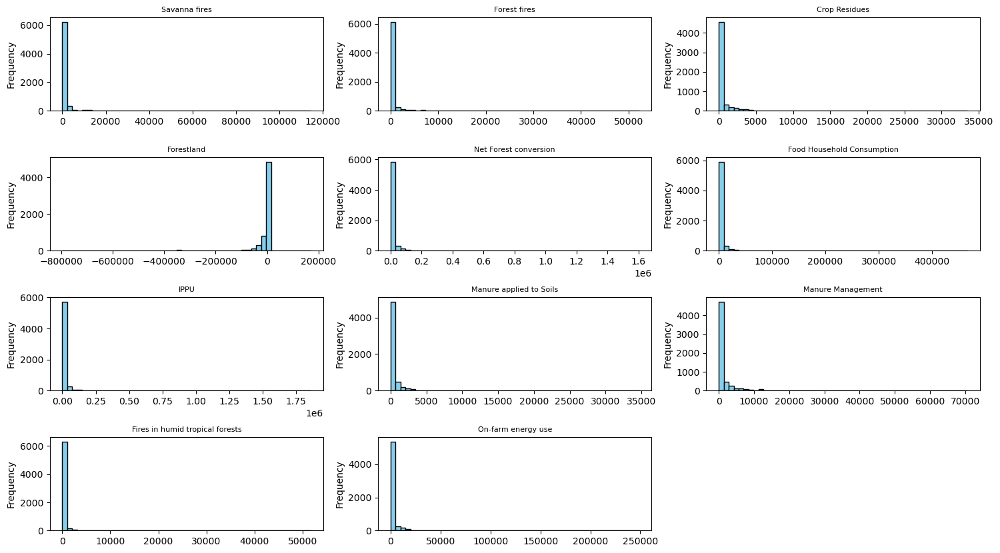

In [10]:
null_data = df.isnull()
fig = plt.figure(figsize=(18, 10))
fig.subplots_adjust(hspace = 0.5, wspace=.2)

# Plot histograms for all columns
for i, column in enumerate(columns_with_null, 1):
    plt.subplot(4, 3, i)  # Adjust subplot grid (2 rows, 2 columns for this example)
    plt.hist(df[column], bins=50, color='skyblue', edgecolor='black')
    plt.title(f'{column}', fontsize= 8)
    plt.ylabel('Frequency')
    

## 4.2 Data cleaning

In [11]:
# fill null values for each column with column mean
for column in columns_with_null:
    df[column].fillna(df[column].mean(), inplace=True)

C:\Users\bonas\AppData\Local\Temp\ipykernel_30644\2076776446.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(df[column].mean(), inplace=True)


In [12]:
# To check if null values were filled successfully
df.isnull().sum()

Area                               0
Year                               0
Savanna fires                      0
Forest fires                       0
Crop Residues                      0
Rice Cultivation                   0
Drained organic soils (CO2)        0
Pesticides Manufacturing           0
Food Transport                     0
Forestland                         0
Net Forest conversion              0
Food Household Consumption         0
Food Retail                        0
On-farm Electricity Use            0
Food Packaging                     0
Agrifood Systems Waste Disposal    0
Food Processing                    0
Fertilizers Manufacturing          0
IPPU                               0
Manure applied to Soils            0
Manure left on Pasture             0
Manure Management                  0
Fires in organic soils             0
Fires in humid tropical forests    0
On-farm energy use                 0
Rural population                   0
Urban population                   0
T

# Bivariate analysis

## Checking for linearity

To ensure accurate predictions, we need to assess the linearity between predictor and response variables. This can be done by visualizing scatter plots to identify linear trends. If non-linearity is present, a linear regression model may not be suitable.


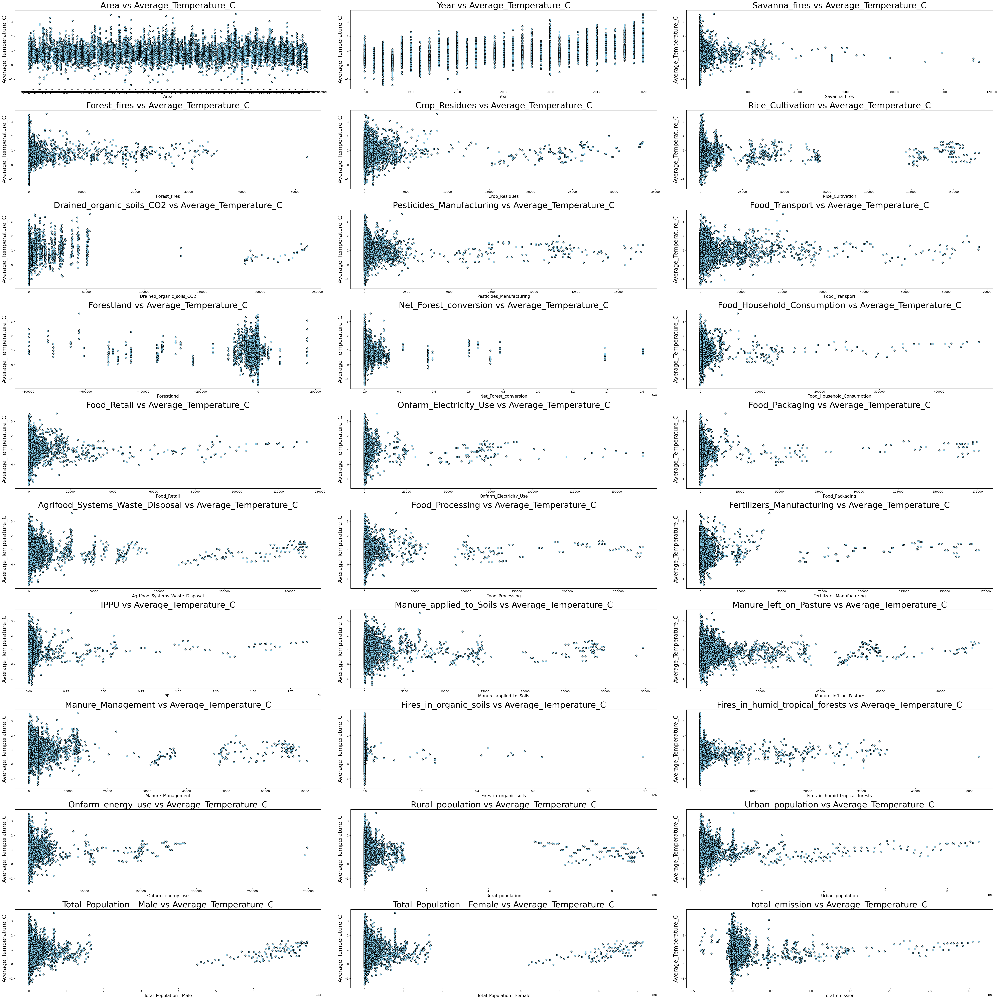

In [16]:
import math

target = 'Average_Temperature_C'
features = ['Area', 'Year', 'Savanna_fires', 'Forest_fires', 'Crop_Residues',
       'Rice_Cultivation', 'Drained_organic_soils_CO2',
       'Pesticides_Manufacturing', 'Food_Transport', 'Forestland',
       'Net_Forest_conversion', 'Food_Household_Consumption', 'Food_Retail',
       'Onfarm_Electricity_Use', 'Food_Packaging',
       'Agrifood_Systems_Waste_Disposal', 'Food_Processing',
       'Fertilizers_Manufacturing', 'IPPU', 'Manure_applied_to_Soils',
       'Manure_left_on_Pasture', 'Manure_Management', 'Fires_in_organic_soils',
       'Fires_in_humid_tropical_forests', 'Onfarm_energy_use',
       'Rural_population', 'Urban_population', 'Total_Population__Male',
       'Total_Population__Female', 'total_emission']
 
n_features = len(features)
n_cols = 3  # Number of columns in the grid
n_rows = math.ceil(n_features / n_cols) 

plt.figure(figsize=(50, 5* n_rows))
for i, feature in enumerate(features, start=1):
    plt.subplot(n_rows, n_cols, i)  # Create subplots
    plt.scatter(df[feature], df['Average_Temperature_C'], color='skyblue', edgecolor='black')
    plt.title(f'{feature} vs {target}', fontsize=30)
    plt.xlabel(feature, fontsize= 15)
    plt.ylabel(target, fontsize= 20)

plt.tight_layout()
plt.show()

# Multivariate analysis

## Checking for multicolinearity

   Multicollinearity occurs when two or more predictor variables in a dataset are strongly correlated. This issue reduces model quality by increasing the standard error of coefficient estimates, making them less precise and leading to wider confidence intervals. Additionally, it complicates estimating the effect of individual predictors on the response variable, as coefficients become sensitive to small changes in the model or data, resulting in instability. 
   
   To test for multicollinearity, we will create paired scatter plots of the predictors and generate a correlation heatmap. These visualizations help identify and assess the strength of correlations among predictors

### Pairwise scatter plot

A pairwise scatter plot matrix creates an n×n grid, where 𝑛 is the number of predictor variables being compared. Each cell in the matrix represents the relationship between two pridictors. Diagonal cells show comparisons of a variable with itself, but instead of scatter plots, they typically display histograms or density plots. These diagonal elements highlight the univariate distribution of each variable, providing insights into the range and distribution of their values.

C:\Users\bonas\AppData\Local\Temp\ipykernel_30644\1126430601.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  g.fig.show()


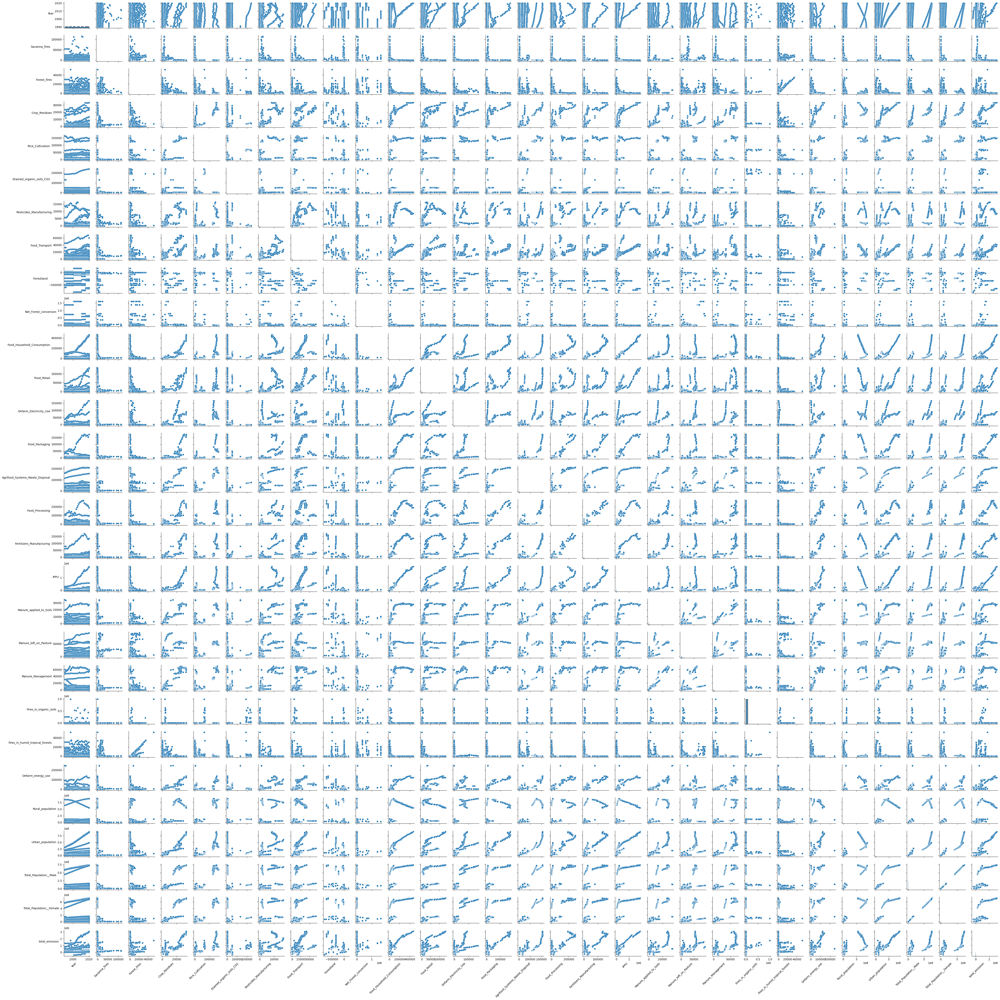

In [117]:
from seaborn import pairplot

g = pairplot(df.drop(columns=['Average_Temperature_C', 'Area'], axis='columns'))
g.fig.set_size_inches(50,50)

for label in g.axes.flat:
    label.set_xlabel(label.get_xlabel(), rotation=45, ha='right', fontsize=10)
    label.set_ylabel(label.get_ylabel(), rotation=0, ha='right', fontsize=10)

# Adjust the layout to avoid overlap
g.fig.tight_layout()
g.fig.show()

## Correlation heatmap

<Figure size 1500x600 with 0 Axes>

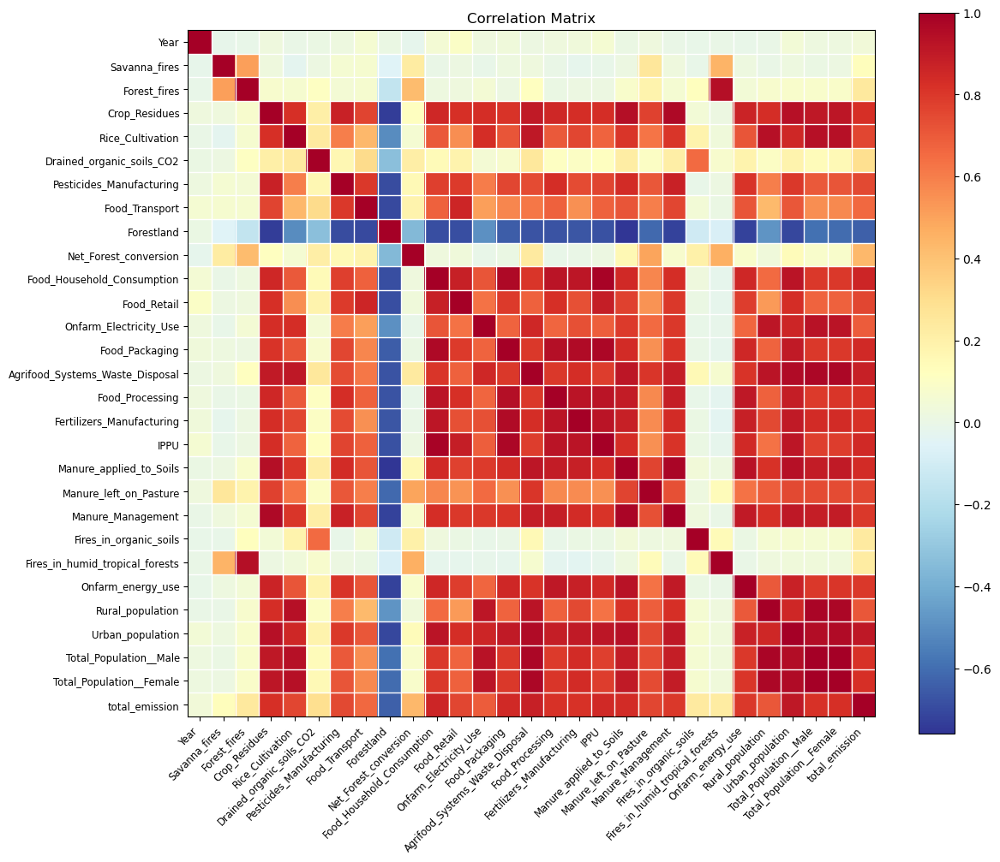

In [17]:
from statsmodels.graphics.correlation import plot_corr
corr = df.drop(columns=['Average_Temperature_C', 'Area'], axis='columns').corr()

fig = plt.figure(figsize=(15, 6))
fig= plot_corr(corr,xnames=corr.columns)
fig.set_size_inches(15,15)

## Ordinal least squares

### Generate regression string

In the R programming language, fitting a machine learning model typically involves defining the relationship between variables using a formula-based interface. In this interface, a string of the form:

`y ~ X`

The string is read as "Regress *y* on $X$", indicating that we want to model the relationship between the response variable *y* and the predictor variable(s) $X$.

In Python's statsmodels library, the formula interface is used to define regression models. To fit a model using this approach, we need to construct a formula string. For example, a formula like y ~ $X_1$ + $X_2$ specifies a regression model where y is the dependent variable, and $X_1$ and $X_2$ are the predictors.

In [141]:
import statsmodels.formula.api as sm

target = 'Average_Temperature_C'
independent_columns = ['Year', 'Savanna_fires', 'Forest_fires', 'Crop_Residues',
       'Rice_Cultivation', 'Drained_organic_soils_CO2',
       'Pesticides_Manufacturing', 'Food_Transport', 'Forestland',
       'Net_Forest_conversion', 'Food_Household_Consumption', 'Food_Retail',
       'Onfarm_Electricity_Use', 'Food_Packaging',
       'Agrifood_Systems_Waste_Disposal', 'Food_Processing',
       'Fertilizers_Manufacturing', 'IPPU', 'Manure_applied_to_Soils',
       'Manure_left_on_Pasture', 'Manure_Management', 'Fires_in_organic_soils',
       'Fires_in_humid_tropical_forests', 'Onfarm_energy_use',
       'Rural_population', 'Urban_population', 'Total_Population__Male',
       'Total_Population__Female', 'total_emission']

formula_str = target+' ~ '+'+'.join(independent_columns)
formula_str


'Average_Temperature_C ~ Year+Savanna_fires+Forest_fires+Crop_Residues+Rice_Cultivation+Drained_organic_soils_CO2+Pesticides_Manufacturing+Food_Transport+Forestland+Net_Forest_conversion+Food_Household_Consumption+Food_Retail+Onfarm_Electricity_Use+Food_Packaging+Agrifood_Systems_Waste_Disposal+Food_Processing+Fertilizers_Manufacturing+IPPU+Manure_applied_to_Soils+Manure_left_on_Pasture+Manure_Management+Fires_in_organic_soils+Fires_in_humid_tropical_forests+Onfarm_energy_use+Rural_population+Urban_population+Total_Population__Male+Total_Population__Female+total_emission'

In [142]:
# construct and fit model using OLS
model=sm.ols(formula=formula_str, data=df)
fitted = model.fit()

print(fitted.summary())

                              OLS Regression Results                             
Dep. Variable:     Average_Temperature_C   R-squared:                       0.329
Model:                               OLS   Adj. R-squared:                  0.326
Method:                    Least Squares   F-statistic:                     117.1
Date:                   Mon, 09 Dec 2024   Prob (F-statistic):               0.00
Time:                           09:29:27   Log-Likelihood:                -4404.8
No. Observations:                   6965   AIC:                             8870.
Df Residuals:                       6935   BIC:                             9075.
Df Model:                             29                                         
Covariance Type:               nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

In [143]:
# Get p-values for all features
p_values = fitted.pvalues  

# Filter for p-values < 0.05
significant_p_values = p_values[p_values < 0.05]
significant_p_values

Intercept                    0.000000e+00
Year                         0.000000e+00
Savanna_fires                4.697410e-03
Forest_fires                 2.297938e-03
Crop_Residues                4.410824e-05
Rice_Cultivation             1.869318e-06
Drained_organic_soils_CO2    1.764998e-03
Food_Transport               3.425188e-02
Forestland                   2.511029e-07
Net_Forest_conversion        3.502804e-06
Food_Retail                  6.778493e-05
Food_Processing              2.589883e-02
Fertilizers_Manufacturing    6.310532e-08
IPPU                         1.398778e-03
Manure_applied_to_Soils      1.283501e-04
Manure_left_on_Pasture       2.116464e-08
Fires_in_organic_soils       1.477797e-07
Urban_population             1.142935e-02
total_emission               2.723150e-06
dtype: float64

In [144]:
# generate regression string for significant predictors
significant_features = ['Savanna_fires', 'Rice_Cultivation', 'Drained_organic_soils_CO2', 'Food_Transport', 
                        'Forestland', 'Net_Forest_conversion', 'Food_Retail', 'Year', 'Forest_fires',
                        'Food_Processing', 'Fertilizers_Manufacturing', 'IPPU', 'Manure_left_on_Pasture', 
                        'Fires_in_organic_soils', 'Crop_Residues', 'Manure_applied_to_Soils', 'Manure_left_on_Pasture', 
                        'Urban_population', 'total_emission', 'Fires_in_organic_soils']
formula_str = target+' ~ '+'+'.join(significant_features)
formula_str


'Average_Temperature_C ~ Savanna_fires+Rice_Cultivation+Drained_organic_soils_CO2+Food_Transport+Forestland+Net_Forest_conversion+Food_Retail+Year+Forest_fires+Food_Processing+Fertilizers_Manufacturing+IPPU+Manure_left_on_Pasture+Fires_in_organic_soils+Crop_Residues+Manure_applied_to_Soils+Manure_left_on_Pasture+Urban_population+total_emission+Fires_in_organic_soils'

In [145]:
# ols model for significant features
model=sm.ols(formula=formula_str, data=df)
fitted = model.fit()

print(fitted.summary())

                              OLS Regression Results                             
Dep. Variable:     Average_Temperature_C   R-squared:                       0.326
Model:                               OLS   Adj. R-squared:                  0.325
Method:                    Least Squares   F-statistic:                     187.0
Date:                   Mon, 09 Dec 2024   Prob (F-statistic):               0.00
Time:                           09:29:56   Log-Likelihood:                -4416.8
No. Observations:                   6965   AIC:                             8872.
Df Residuals:                       6946   BIC:                             9002.
Df Model:                             18                                         
Covariance Type:               nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

## Multiple linear regression

### Decision Tree

In [146]:
from sklearn.metrics import r2_score

# Asign x and y to data values
X = df.drop(columns=['Area', 'Average_Temperature_C'])
y = df['Average_Temperature_C']

# Train data
x_train, x_test, y_train, y_test = train_test_split(X, y,test_size=0.2,random_state=6)



In [147]:
# Decision tree fitting and model evaluation


regr_tree = DecisionTreeRegressor(max_depth=3)
regr_tree.fit(x_train,y_train)
y_pred = regr_tree.predict(x_test)

print("r2: ", r2_score(y_test, y_pred))
print("MSE: ", mean_squared_error(y_test,y_pred))

r2:  0.3682186333909738
MSE:  0.19151756342629514


## Random forest regression

In [148]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

In [149]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

# Initialize and train Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(x_train, y_train)

# Predict on test data
y_pred = rf_regressor.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


r2, mse

(0.5602270153733129, 0.1333123370327797)

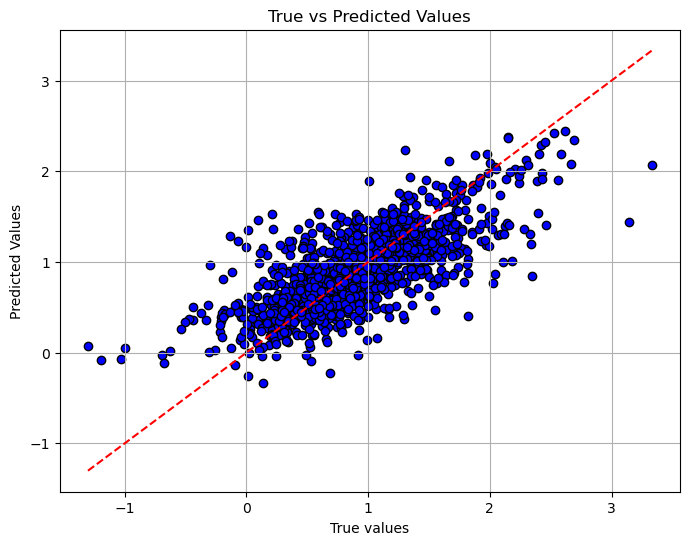

In [35]:
# Random forest model
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', edgecolor='k')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Values')
plt.grid(True)
plt.show()

### Feature importance

In [ ]:
# feature importance use random forest
feature_importances = rf_regressor.feature_importances_

# Print feature importances
important_features = []
for feature, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature}, Importance: {importance}")
    important_features.append(feature)

    

Feature: Year, Importance: 0.37778216162503164
Feature: Savanna_fires, Importance: 0.02364536248423485
Feature: Forest_fires, Importance: 0.013708690365372037
Feature: Crop_Residues, Importance: 0.019430608714507636
Feature: Rice_Cultivation, Importance: 0.024082706239887893
Feature: Drained_organic_soils_CO2, Importance: 0.03042285210539621
Feature: Pesticides_Manufacturing, Importance: 0.016399591217418397
Feature: Food_Transport, Importance: 0.03069358806815827
Feature: Forestland, Importance: 0.016800630939293893
Feature: Net_Forest_conversion, Importance: 0.023133144275463233
Feature: Food_Household_Consumption, Importance: 0.021916812891419415
Feature: Food_Retail, Importance: 0.026797309142294928
Feature: Onfarm_Electricity_Use, Importance: 0.027550740410348013
Feature: Food_Packaging, Importance: 0.02219258519060498
Feature: Agrifood_Systems_Waste_Disposal, Importance: 0.02144786073819483
Feature: Food_Processing, Importance: 0.01978841264587422
Feature: Fertilizers_Manufacturi

['Year',
 'Savanna_fires',
 'Forest_fires',
 'Crop_Residues',
 'Rice_Cultivation',
 'Drained_organic_soils_CO2',
 'Pesticides_Manufacturing',
 'Food_Transport',
 'Forestland',
 'Net_Forest_conversion',
 'Food_Household_Consumption',
 'Food_Retail',
 'Onfarm_Electricity_Use',
 'Food_Packaging',
 'Agrifood_Systems_Waste_Disposal',
 'Food_Processing',
 'Fertilizers_Manufacturing',
 'IPPU',
 'Manure_applied_to_Soils',
 'Manure_left_on_Pasture',
 'Manure_Management',
 'Fires_in_organic_soils',
 'Fires_in_humid_tropical_forests',
 'Onfarm_energy_use',
 'Rural_population',
 'Urban_population',
 'Total_Population__Male',
 'Total_Population__Female',
 'total_emission']

In [62]:

target = 'Average_Temperature_C'

formula_str = target+' ~ '+'+'.join(important_features)
formula_str

'Average_Temperature_C ~ Year+Savanna_fires+Forest_fires+Crop_Residues+Rice_Cultivation'

In [ ]:
model=sm.ols(formula=formula_str, data=df)
fitted = model.fit()

print(fitted.summary())

                              OLS Regression Results                             
Dep. Variable:     Average_Temperature_C   R-squared:                       0.302
Model:                               OLS   Adj. R-squared:                  0.302
Method:                    Least Squares   F-statistic:                     602.7
Date:                   Sun, 08 Dec 2024   Prob (F-statistic):               0.00
Time:                           22:36:30   Log-Likelihood:                -4540.2
No. Observations:                   6965   AIC:                             9092.
Df Residuals:                       6959   BIC:                             9134.
Df Model:                              5                                         
Covariance Type:               nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept 

## Homoscedasticity
  Check if residual variance remains constant along fitted values

### Residual analysis 

#### Normalization

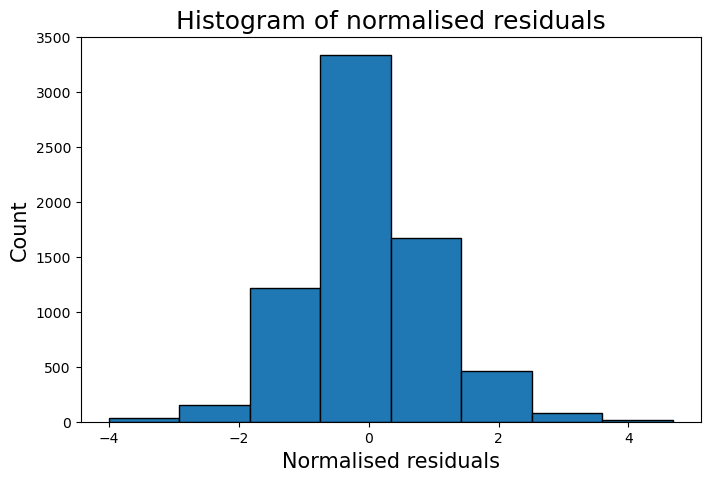

In [51]:
# distribution of residuals
plt.figure(figsize=(8,5))
plt.hist(fitted.resid_pearson,bins=8,edgecolor='k')
plt.ylabel('Count',fontsize=15)
plt.xlabel('Normalised residuals',fontsize=15)
plt.title("Histogram of normalised residuals",fontsize=18)
plt.show()

#### Residuals vs Fitted

To evaluate the presence of homoscedasticity or heteroscedasticity, we can plot the residuals against the fitted values (e.g., total emission). If the scatterplot displays a random and uniform spread of points, this indicates homoscedasticity, where the variance of residuals remains consistent across all levels of the predictor variable(s). In contrast, heteroscedasticity manifests as a systematic change in the spread of residuals with increasing or decreasing fitted values, often forming a cone-like pattern

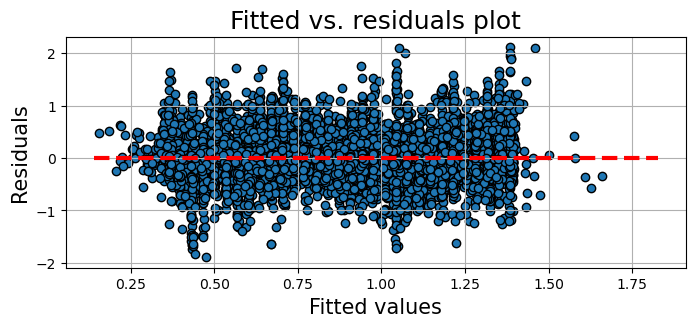

In [135]:
plt.figure(figsize=(8,3))
p=plt.scatter(x=fitted.fittedvalues,y=fitted.resid,edgecolor='k')
xmin = min(fitted.fittedvalues)
xmax = max(fitted.fittedvalues)
plt.hlines(y=0,xmin=xmin*0.9,xmax=xmax*1.1,color='red',linestyle='--',lw=3)
plt.xlabel("Fitted values",fontsize=15)
plt.ylabel("Residuals",fontsize=15)
plt.title("Fitted vs. residuals plot",fontsize=18)
plt.grid(True)
plt.show()

## Breusch-Pagan test


In [138]:
import statsmodels.stats.api as sms
# Calculate residuals
residuals = fitted.resid
# Perform Breusch-Pagan test
bp_test_result = sms.het_breuschpagan(residuals, fitted.model.exog)
print("Breusch-Pagan Test Results:")
print("LM Statistic:", bp_test_result[0])
print("LM-Test p-value:", bp_test_result[1])
print("F-Statistic:", bp_test_result[2])
print("F-Test p-value:", bp_test_result[3])

Breusch-Pagan Test Results:
LM Statistic: 73.18503736210474
LM-Test p-value: 2.224340365955377e-14
F-Statistic: 14.779696720352767
F-Test p-value: 1.8896429319337858e-14


## Q-Q PLOT


<Figure size 800x500 with 0 Axes>

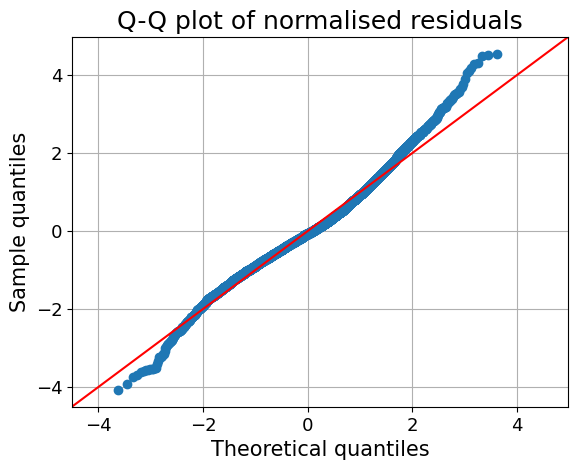

In [136]:
from statsmodels.graphics.gofplots import qqplot
plt.figure(figsize=(8,5))
fig=qqplot(fitted.resid_pearson,line='45',fit='True')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel("Theoretical quantiles",fontsize=15)
plt.ylabel("Sample quantiles",fontsize=15)
plt.title("Q-Q plot of normalised residuals",fontsize=18)
plt.grid(True)
plt.show()

### Feature engineering

In [130]:
import statsmodels.api as sm
X = sm.add_constant(df[important_features])


In [132]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Fit the OLS model
model = sm.OLS(y, X).fit()

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


            feature           VIF
0             const  50951.618009
1              Year      1.002493
2     Savanna_fires      1.364594
3      Forest_fires      1.360101
4     Crop_Residues      3.136643
5  Rice_Cultivation      3.150180


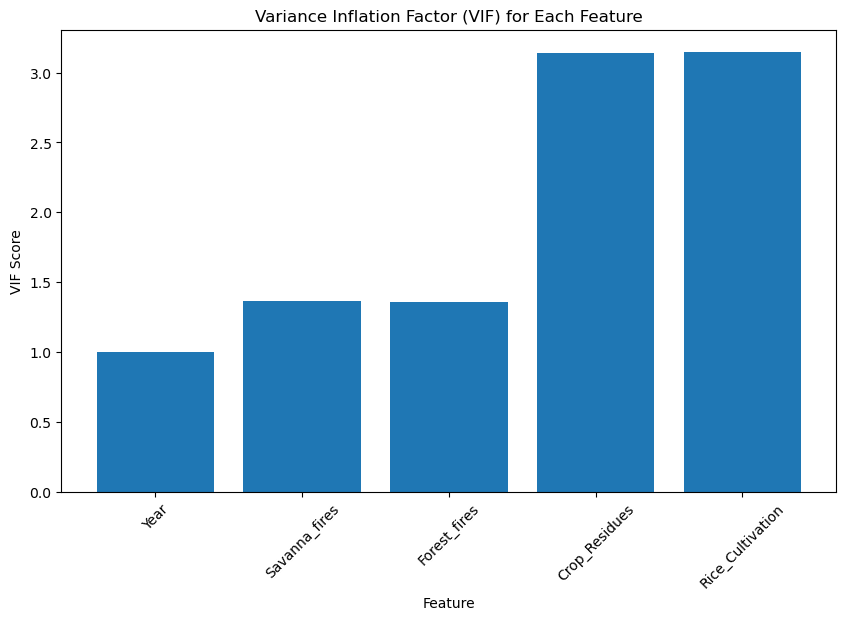

In [133]:
# Plot the VIF scores
plt.figure(figsize=(10, 6))
plt.bar(vif_data['feature'][1:], vif_data['VIF'][1:])
plt.xlabel('Feature')
plt.ylabel('VIF Score')
plt.title('Variance Inflation Factor (VIF) for Each Feature')
plt.xticks(rotation=45)
plt.show()

In [112]:
vif_features = ['Year', 'Savanna_fires', 'Forest_fires', 'Crop_Residues', 'Rice_Cultivation']

formula_str = target+' ~ '+'+'.join(vif_features)
formula_str


'Average_Temperature_C ~ Year+Savanna_fires+Forest_fires+Crop_Residues+Rice_Cultivation'

In [113]:
model=sm.ols(formula=formula_str, data=df)
fitted = model.fit()

print(fitted.summary())

                              OLS Regression Results                             
Dep. Variable:     Average_Temperature_C   R-squared:                       0.302
Model:                               OLS   Adj. R-squared:                  0.302
Method:                    Least Squares   F-statistic:                     602.7
Date:                   Mon, 09 Dec 2024   Prob (F-statistic):               0.00
Time:                           02:12:33   Log-Likelihood:                -4540.2
No. Observations:                   6965   AIC:                             9092.
Df Residuals:                       6959   BIC:                             9134.
Df Model:                              5                                         
Covariance Type:               nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept 

In [114]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
import math

X = pd.DataFrame(df[vif_features])

x_scaler = StandardScaler()
X_scaled = x_scaler.fit_transform(X)

X_standardise = pd.DataFrame(X_scaled,columns=X.columns)

X_train, X_test, y_train, y_test = train_test_split(
    X_standardise, y, test_size=0.2, shuffle=True, random_state=42)

In [150]:
# Ridge Regression

ridge = Ridge(alpha=0.1)
ridge.fit(X_train, y_train)

predictions_ridge = ridge.predict(X_test)

ridge_r2 = r2_score(y_test, predictions_ridge)
ridge_mse = mean_squared_error(y_test, predictions_ridge)

print(f"Ridge Regression - R2: {ridge_r2}, MSE: {ridge_mse}")

Ridge Regression - R2: -0.0006266059167021609, MSE: 0.3033289355988305


## Random forest

A random forest is a powerful non-parametric algorithm and an **ensemble** method **built on decision trees**, meaning that it relies on aggregating the results of an ensemble of decision trees.

In [124]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score

# Assuming X is your feature matrix and y is your target variable

# Create a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Create a 5-fold cross-validation object
kf = KFold(n_splits=5, shuffle=True, random_state=42)

X = df.drop(columns=['Area', 'Average_Temperature_C'])
y = df['Average_Temperature_C']

# Perform cross-validation and calculate mean squared error
mse_scores = cross_val_score(rf_model, X, y, cv=kf, scoring='neg_mean_squared_error')
r2_scores = cross_val_score(rf_model, X, y, cv=kf, scoring='r2')
print("R-squared:", r2_scores.mean())
print("Mean Squared Error:", -mse_scores.mean())

R-squared: 0.5827275239011065
Mean Squared Error: 0.12903641778181218


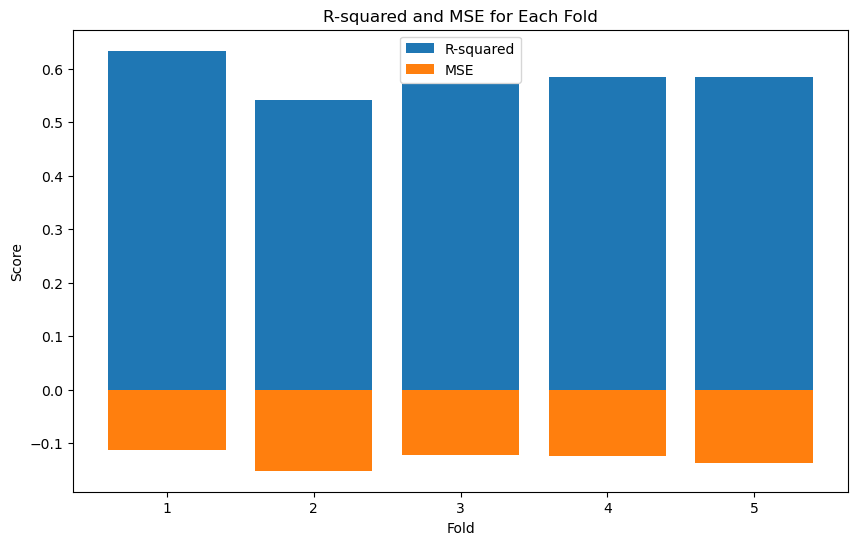

In [125]:
# Plot the scores
plt.figure(figsize=(10, 6))
plt.bar(range(1, 6), r2_scores, label='R-squared')
plt.bar(range(1, 6), mse_scores, label='MSE')
plt.xlabel('Fold')
plt.ylabel('Score')
plt.title('R-squared and MSE for Each Fold')
plt.legend()
plt.show()